In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
base_dir = '/content/drive/MyDrive/MilitaryBinaryDS'

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

In [ ]:
BATCH_SIZE = 32
IMG_SIZE = (224, 224)
NUM_CLASSES = 2

train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE,
                                                            label_mode='binary',  # Use 'categorical' for one-hot encoding
    class_names=None  # Automatically infer class names
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(validation_dir,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE,
                                                                 label_mode='binary',  # Use 'categorical' for one-hot encoding
    class_names=None  # Automatically infer class names
)

Found 412 files belonging to 2 classes.
Found 64 files belonging to 2 classes.


In [ ]:
class_names = train_dataset.class_names
print(class_names)

['Military', 'Non-Military']


<ipython-input-6-71800165f7f2>:19: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  actual_label = int(labels[random_index].numpy())


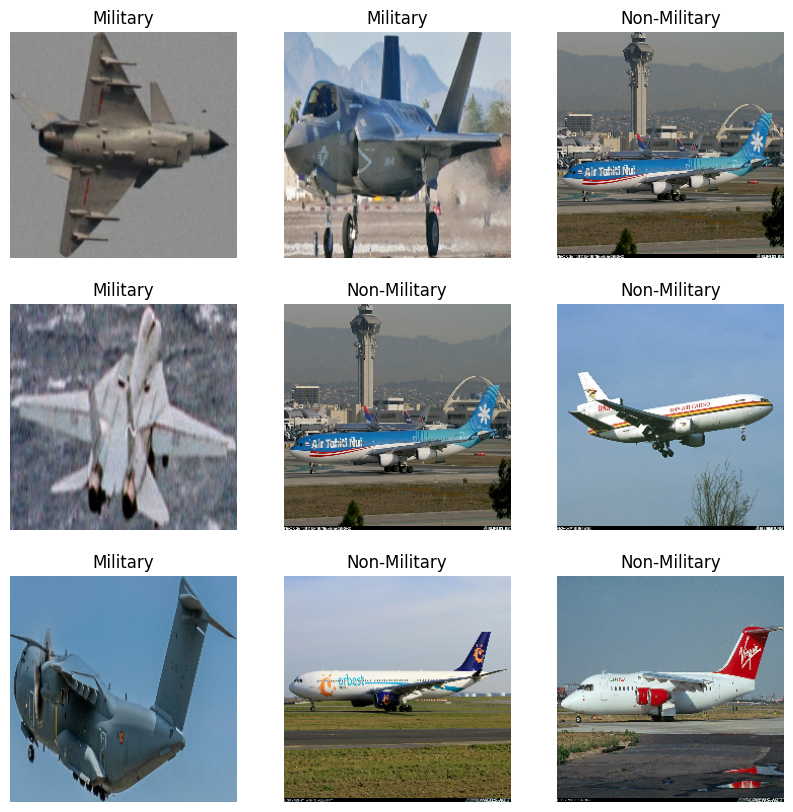

In [ ]:
import matplotlib.pyplot as plt
import random

# Get a batch of images and labels from the dataset
for images, labels in train_dataset.take(1):
    # Get the total number of images in the batch
    num_images = len(images)

    # Show a random selection of 9 images
    plt.figure(figsize=(10, 10))
    for i in range(min(9, num_images)):
        # Randomly select an index
        random_index = random.randint(0, num_images - 1)

        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[random_index].numpy().astype("uint8"))

        # Use the actual class label for binary classification
        actual_label = int(labels[random_index].numpy())
        label_str = "Military" if actual_label == 0 else "Non-Military"

        plt.title(label_str)
        plt.axis("off")

    plt.show()


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
# test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

In [ ]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomZoom(0.2),
  tf.keras.layers.RandomContrast(0.2),
  tf.keras.layers.RandomBrightness(0.2)
])

# preprocess_input = tf.keras.applications.resnet50.preprocess_input
preprocess_input = tf.keras.applications.vgg16.preprocess_input

In [ ]:
IMG_SHAPE = IMG_SIZE + (3,)

#Normal model

In [ ]:
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 224x224 with 3 bytes color
    tf.keras.layers.Lambda(preprocess_input, input_shape=IMG_SHAPE),
    data_augmentation,
    tf.keras.layers.Conv2D(16, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),
    #---------------------------------------------------------
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    #---------------------------------------------------------
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    #---------------------------------------------------------
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.5),

    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    #---------------------------------------------------------
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    # Only 1 output neuron. It will contain a value from 0-1
    tf.keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda_3 (Lambda)                    │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential_4 (Sequential)            │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 222, 222, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 111, 111, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 109, 109, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 109, 109, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 52, 52, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 24, 24, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 10, 10, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 5, 5, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 6400)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │         819,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,377,441 (5.25 MB)

 Trainable params: 1,377,249 (5.25 MB)

 Non-trainable params: 192 (768.00 B)

In [ ]:
from sklearn.utils import class_weight
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Adjust optimizer with a lower learning rate
optimizer = Adam(learning_rate=1e-4)

# Include callbacks for learning rate reduction and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
]

# Assuming `train_dataset` is a tf.data.Dataset
labels = []
for _, batch_labels in train_dataset:
    labels.extend(batch_labels.numpy().flatten()) # Flatten the batch_labels array

class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(labels), y=labels)

model.compile(optimizer=optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(train_dataset,
                    validation_data=validation_dataset,
                    epochs=20,
                    callbacks=callbacks,
                    class_weight=dict(enumerate(class_weights)),  # Use computed class weights
                    verbose=1)

Epoch 1/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 9s 355ms/step - accuracy: 0.5310 - loss: 1.1301 - val_accuracy: 0.5000 - val_loss: 0.6793 - learning_rate: 0.0010
Epoch 2/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 255ms/step - accuracy: 0.5219 - loss: 0.6874 - val_accuracy: 0.6719 - val_loss: 0.6490 - learning_rate: 0.0010
Epoch 3/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - accuracy: 0.6997 - loss: 0.6237 - val_accuracy: 0.6719 - val_loss: 0.5642 - learning_rate: 0.0010
Epoch 4/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 6s 480ms/step - accuracy: 0.7141 - loss: 0.5853 - val_accuracy: 0.8438 - val_loss: 0.3254 - learning_rate: 0.0010
Epoch 5/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 8s 250ms/step - accuracy: 0.8299 - loss: 0.4587 - val_accuracy: 0.8750 - val_loss: 0.3558 - learning_rate: 0.0010
Epoch 6/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 394ms/step - accuracy: 0.7908 - loss: 0.4605 - val_accuracy: 0.8281 - val_loss: 0.3772 - learning_rate: 0.0010
Epoch 7/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - accuracy: 0.8047 - loss: 0.4282 - 

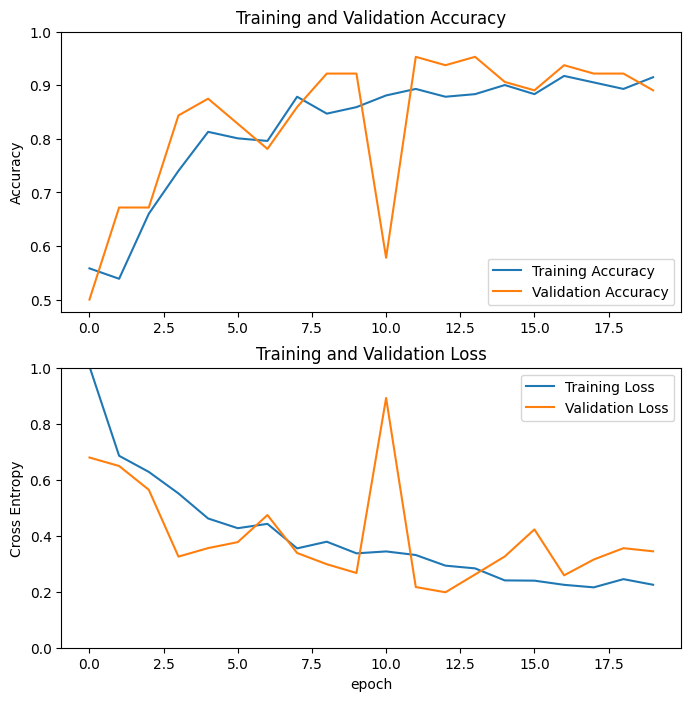

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
print("Evaluate on train data")
score_test = model.evaluate(train_dataset)
for name, value in zip(model.metrics_names, score_test):
    print(name, ': ', value)
print("Evaluate on test data")
score_test = model.evaluate(validation_dataset)
for name, value in zip(model.metrics_names, score_test):
    print(name, ': ', value)

Evaluate on train data
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - accuracy: 0.8881 - loss: 0.2736
loss :  0.2552153468132019
compile_metrics :  0.9077669978141785
Evaluate on test data
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.9375 - loss: 0.2030
loss :  0.1979951560497284
compile_metrics :  0.9375


In [ ]:
model.save("base_military_model.keras")

#New model

In [ ]:
from tensorflow.keras.layers import PReLU

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Lambda(preprocess_input, input_shape=IMG_SHAPE),
    data_augmentation,

    tf.keras.layers.Conv2D(16, (3,3), activation=None),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('leaky_relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(32, (3,3), activation=None),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('gelu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation=None),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation(PReLU()),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation=None),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(256, (3,3), activation=None),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('mish'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(256, activation=None, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.4),

    tf.keras.layers.Dense(512, activation=None, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('gelu'),
    tf.keras.layers.Dropout(0.4),

    tf.keras.layers.Dense(512, activation=None, kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.4),

    tf.keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 222, 222, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 222, 222, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 109, 109, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 52, 52, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 52, 52, 64)          │         173,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 24, 24, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 24, 24, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 24, 24, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 10, 10, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 2,606,177 (9.94 MB)

 Trainable params: 2,602,625 (9.93 MB)

 Non-trainable params: 3,552 (13.88 KB)

In [ ]:
from sklearn.utils import class_weight
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Adjust optimizer with a lower learning rate
optimizer = Adam(learning_rate=1e-4)

# Include callbacks for learning rate reduction and early stopping
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.8, patience=4, verbose=1),
    EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)
]

# Assuming `train_dataset` is a tf.data.Dataset
labels = []
for _, batch_labels in train_dataset:
    labels.extend(batch_labels.numpy().flatten()) # Flatten the batch_labels array

class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(labels), y=labels)
class_weights_dict = dict(enumerate(class_weights))

# Scale down the class weights by a factor (e.g., 0.9)
scaling_factor = 0.9
scaled_class_weights = {key: value * scaling_factor for key, value in class_weights_dict.items()}


model.compile(optimizer=optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

history = model.fit(train_dataset,
                    validation_data=validation_dataset,
                    epochs=30,
                    callbacks=callbacks,
                    class_weight=scaled_class_weights,  # Use computed class weights
                    verbose=1)

Epoch 1/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 12s 456ms/step - accuracy: 0.8802 - loss: 1.3965 - val_accuracy: 0.8281 - val_loss: 1.9083 - learning_rate: 1.0000e-04
Epoch 2/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - accuracy: 0.8385 - loss: 1.3745 - val_accuracy: 0.8750 - val_loss: 1.5791 - learning_rate: 1.0000e-04
Epoch 3/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 344ms/step - accuracy: 0.8998 - loss: 1.2631 - val_accuracy: 0.8438 - val_loss: 1.4760 - learning_rate: 1.0000e-04
Epoch 4/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - accuracy: 0.9043 - loss: 1.2658 - val_accuracy: 0.8438 - val_loss: 1.5355 - learning_rate: 1.0000e-04
Epoch 5/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 266ms/step - accuracy: 0.8995 - loss: 1.2498 - val_accuracy: 0.8438 - val_loss: 1.6917 - learning_rate: 1.0000e-04
Epoch 6/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 376ms/step - accuracy: 0.9105 - loss: 1.2268 - val_accuracy: 0.8594 - val_loss: 1.4794 - learning_rate: 1.0000e-04
Epoch 7/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step - accuracy:

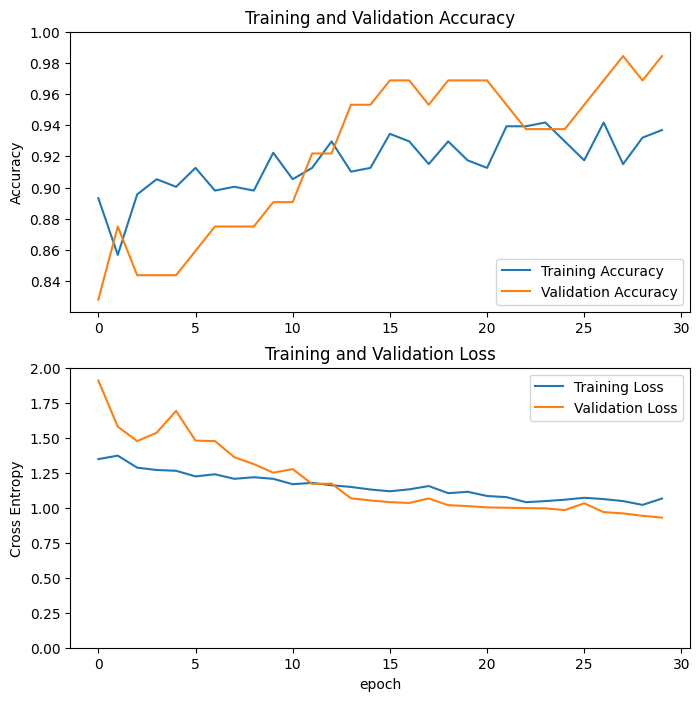

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,2.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
print("Evaluate on train data")
score_test = model.evaluate(train_dataset)
for name, value in zip(model.metrics_names, score_test):
    print(name, ': ', value)
print("Evaluate on test data")
score_test = model.evaluate(validation_dataset)
for name, value in zip(model.metrics_names, score_test):
    print(name, ': ', value)

Evaluate on train data
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 212ms/step - accuracy: 0.9465 - loss: 0.9836
loss :  1.007022738456726
compile_metrics :  0.9490291476249695
Evaluate on test data
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.9792 - loss: 0.9427
loss :  0.9294732809066772
compile_metrics :  0.984375


In [ ]:
model.save("proposed_military_model.keras")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


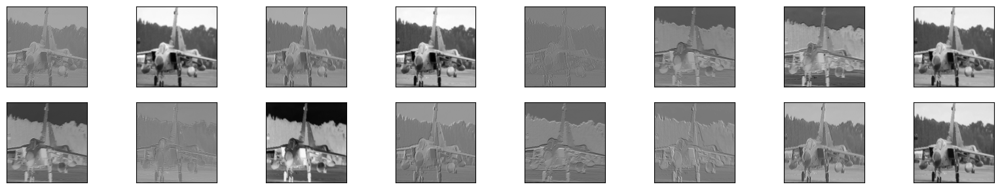

In [ ]:
# import Model
from tensorflow.keras.models import Model
# imports for image preprocessing
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
import numpy as np
from tensorflow.keras.applications.vgg16 import preprocess_input
# import marplotliob
import matplotlib.pyplot as plt


# but the output would be the output of a given convolutional layer (here layer 3)
model2 = Model(inputs=model.inputs , outputs=model.layers[3].output)


# load input image
image = load_img("/content/mil1.jpg" , target_size=(224,224))
# convert the image to an array
image = img_to_array(image)
# expand dimensions so that it represents a single 'sample'
image = np.expand_dims(image, axis=0)
# prepare the image for vgg model ie scale pixel values
image = preprocess_input(image)
#calculating features_map
features = model2.predict(image)


# visualize featrure maps
fig = plt.figure(figsize=(20,15))
for i in range(1,features.shape[3]+1):
    plt.subplot(8,8,i)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(features[0,:,:,i-1] , cmap='gray')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


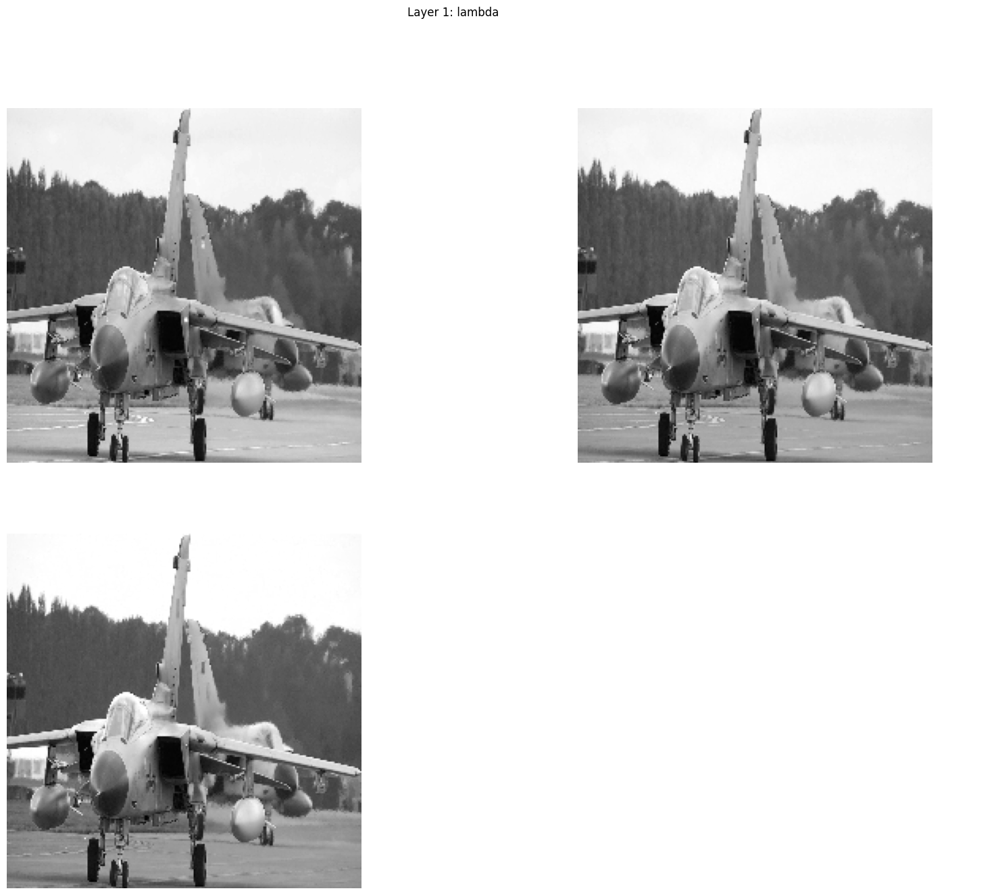

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


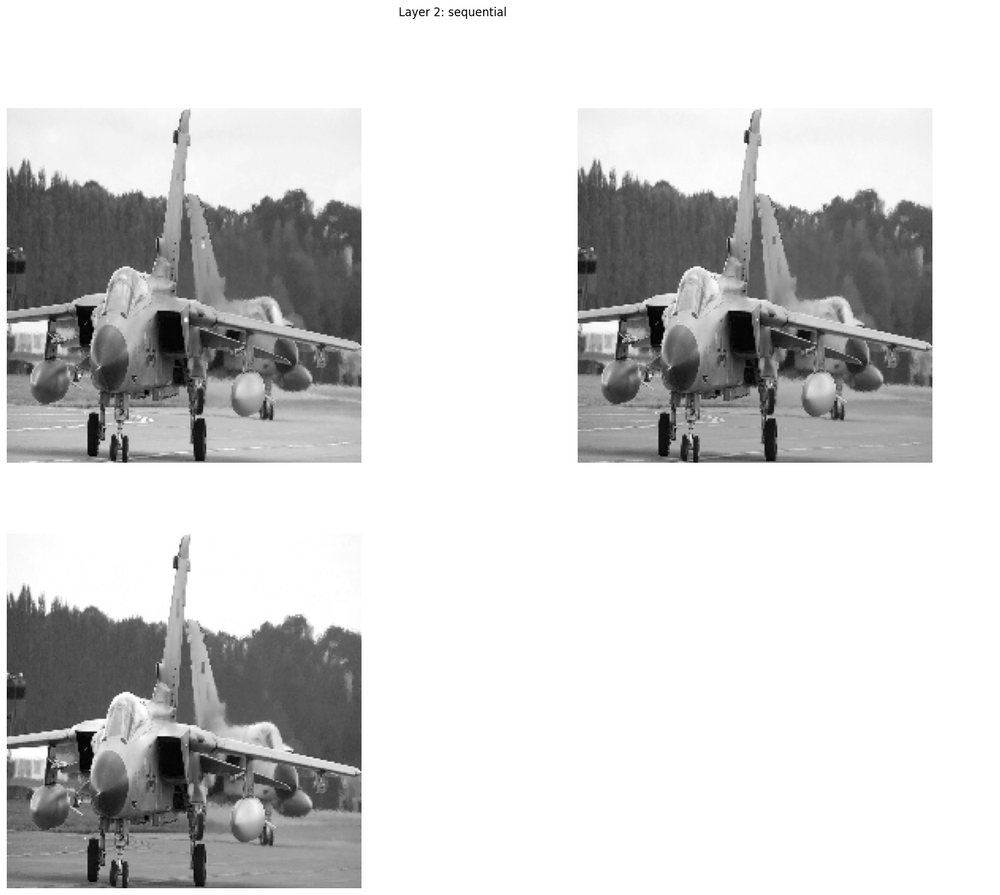

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


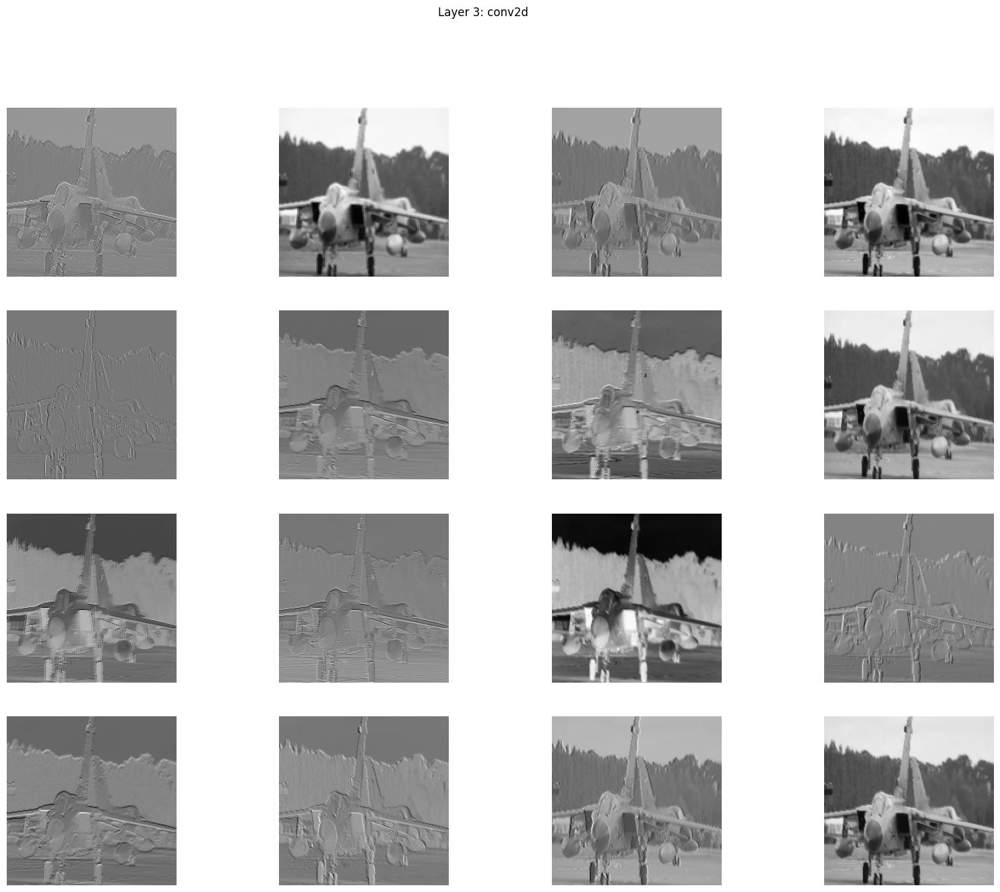

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


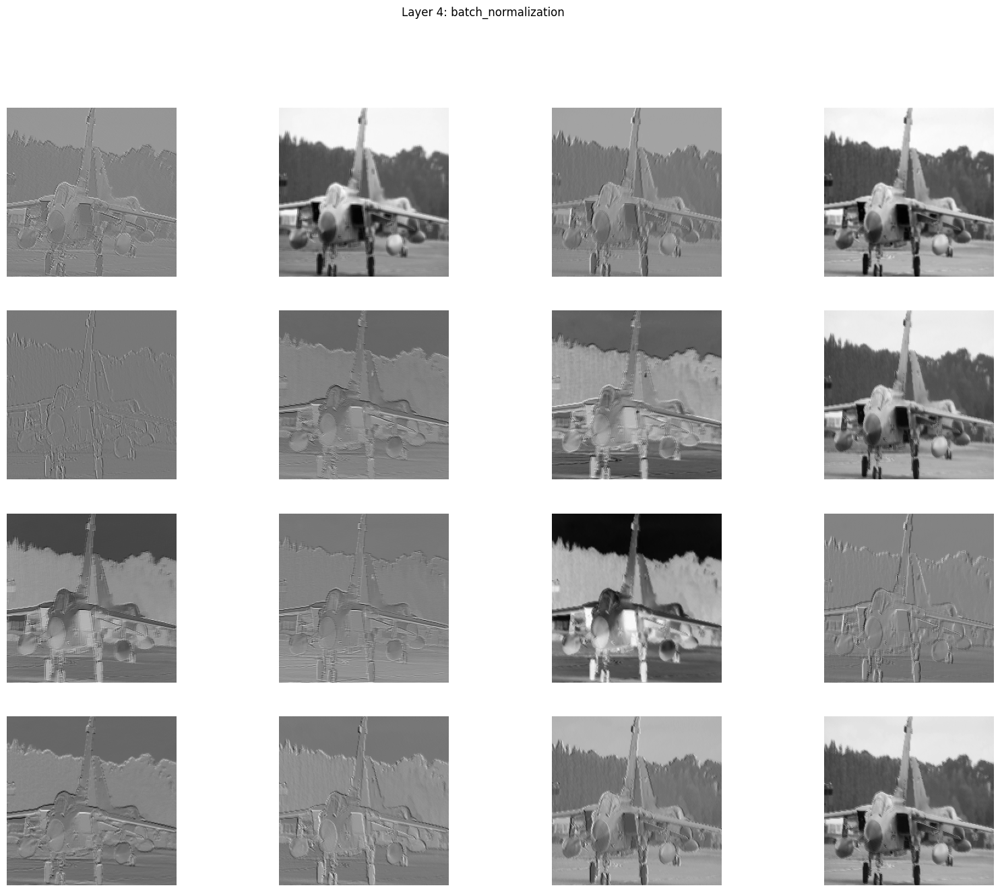

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


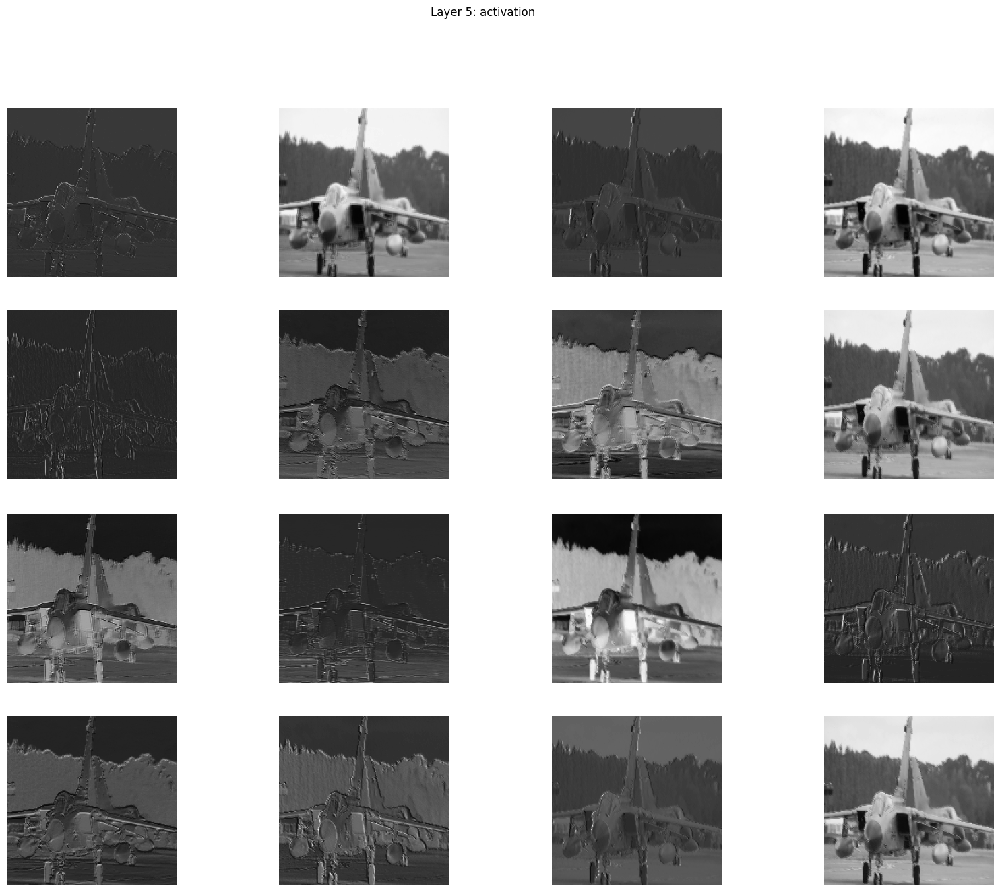

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


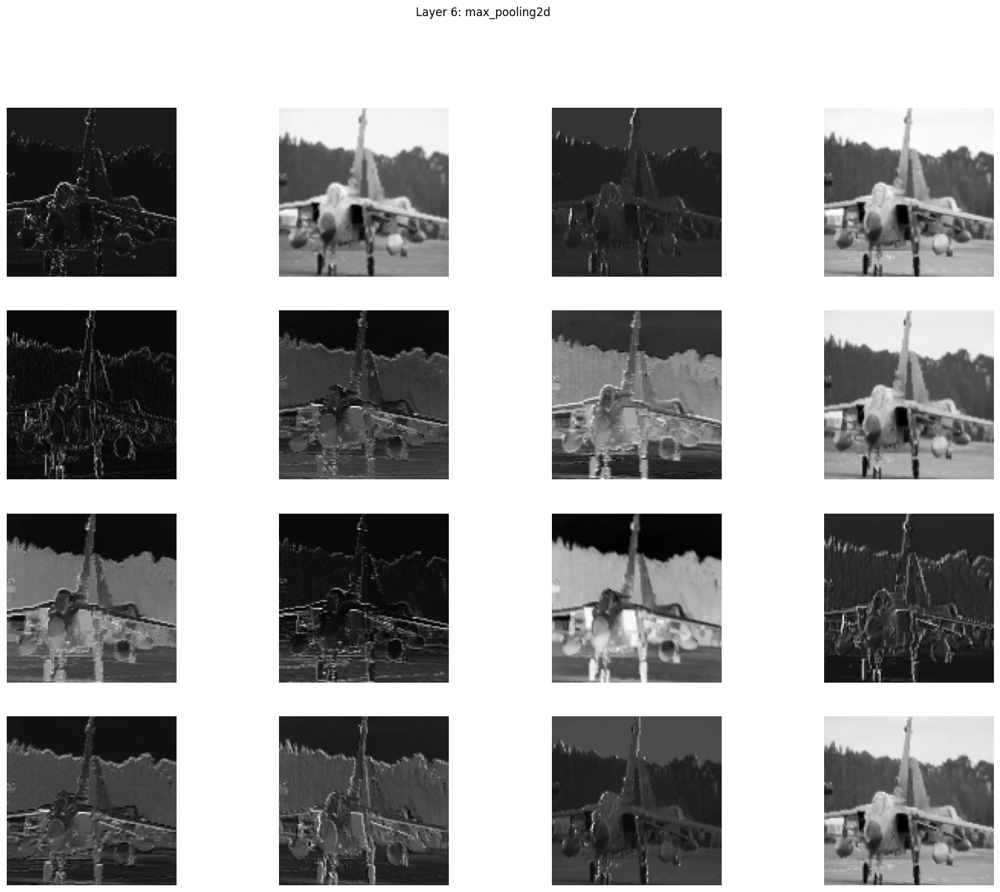

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


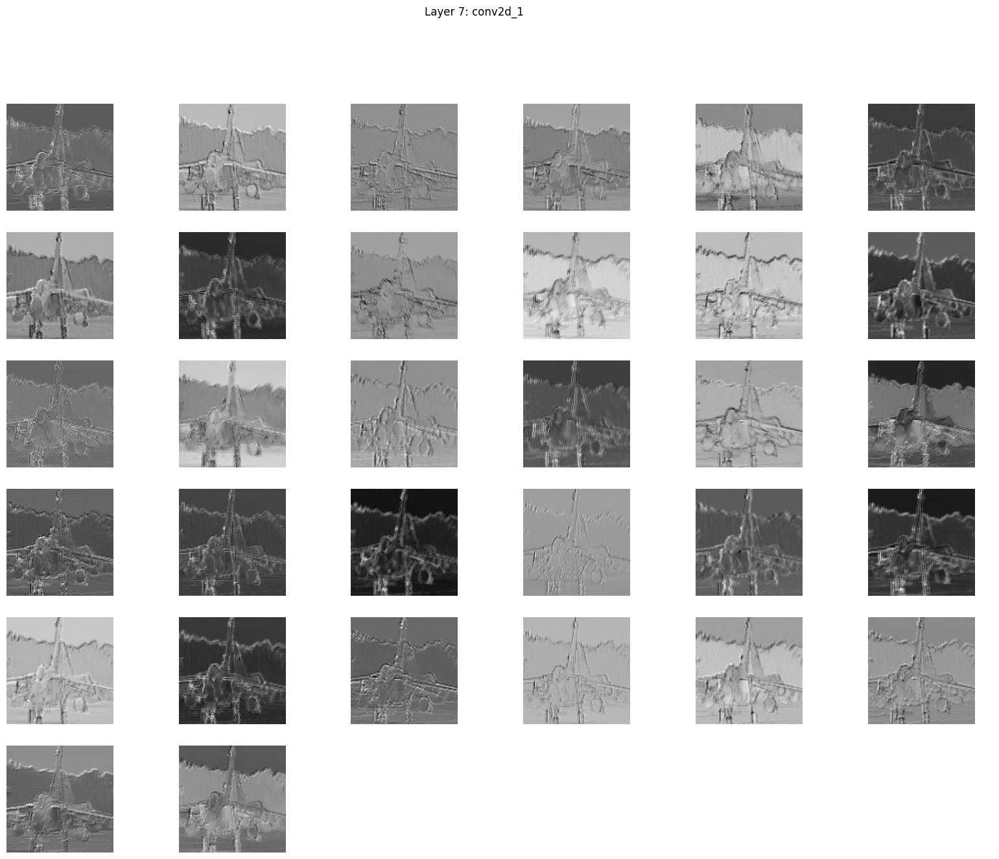

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


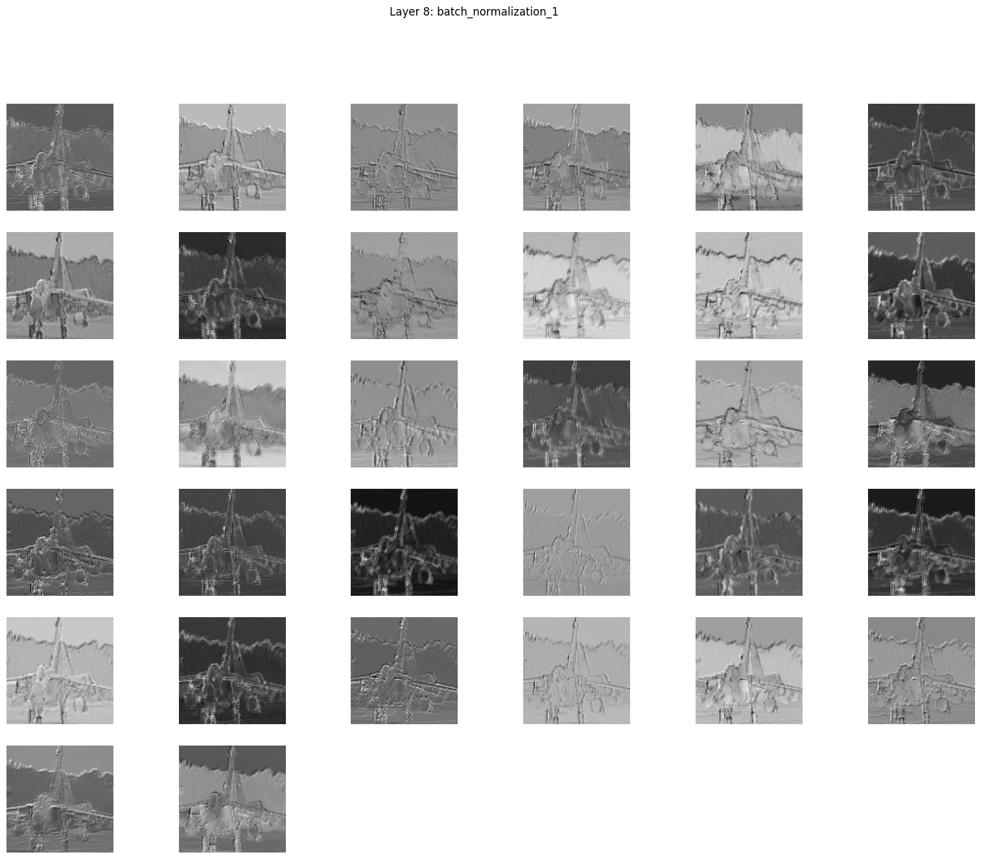

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


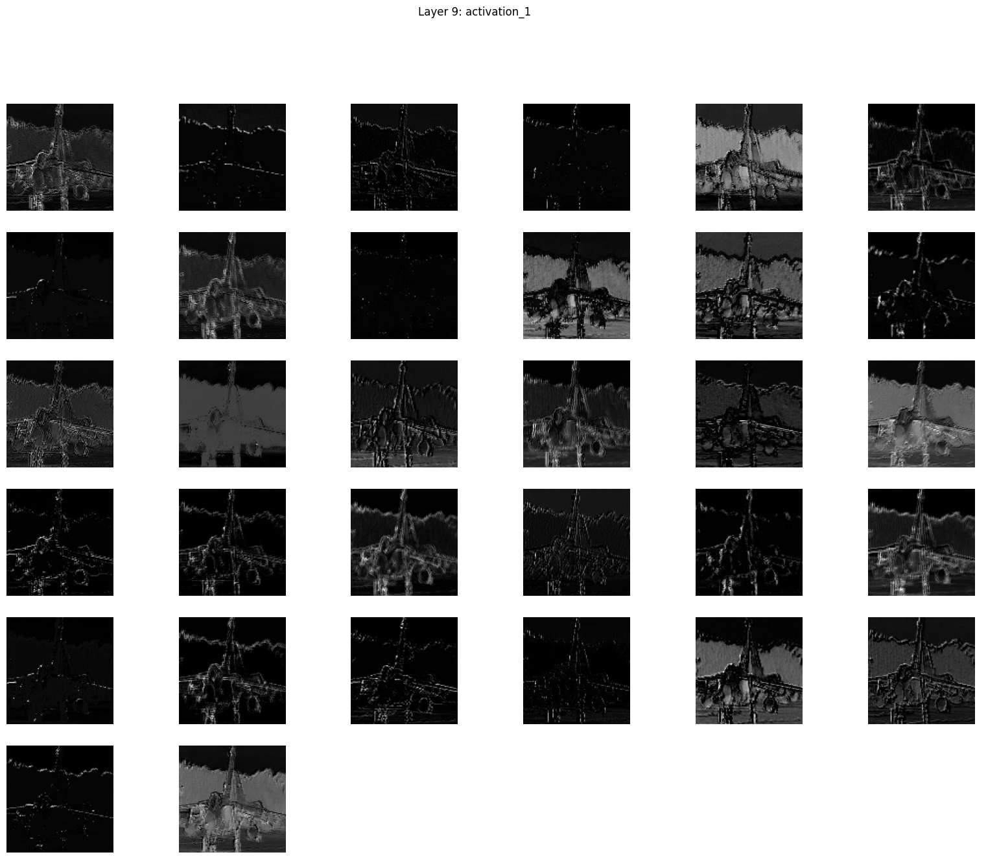

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


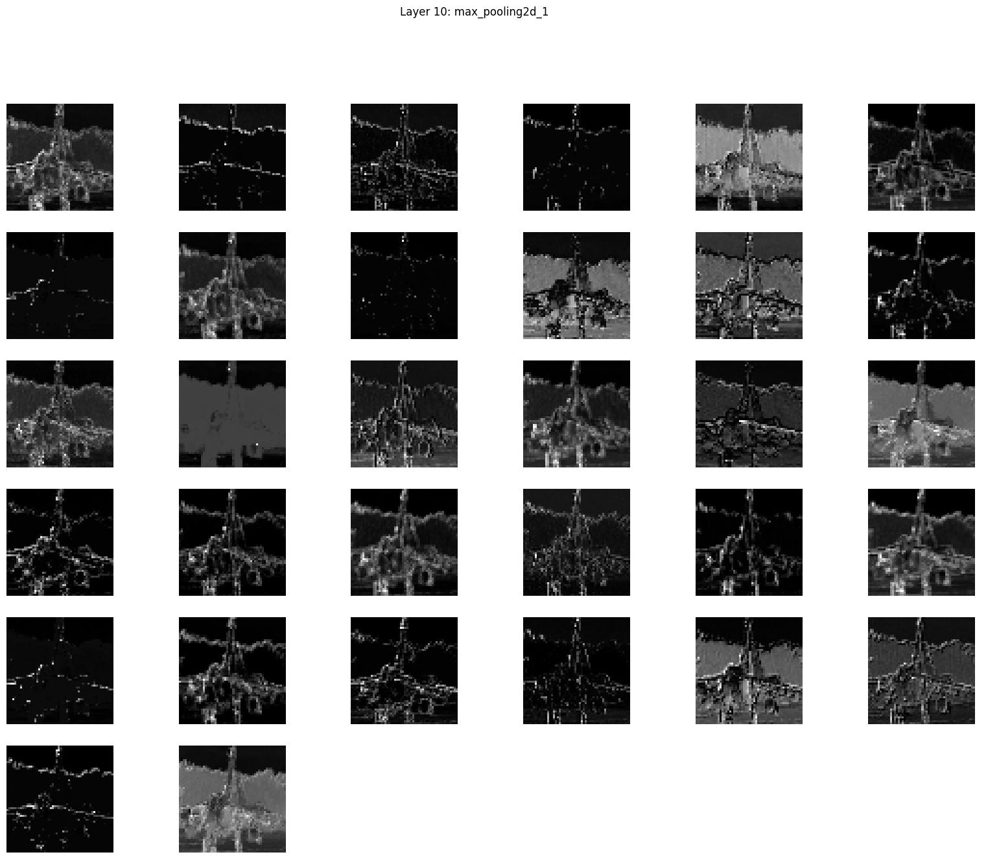

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


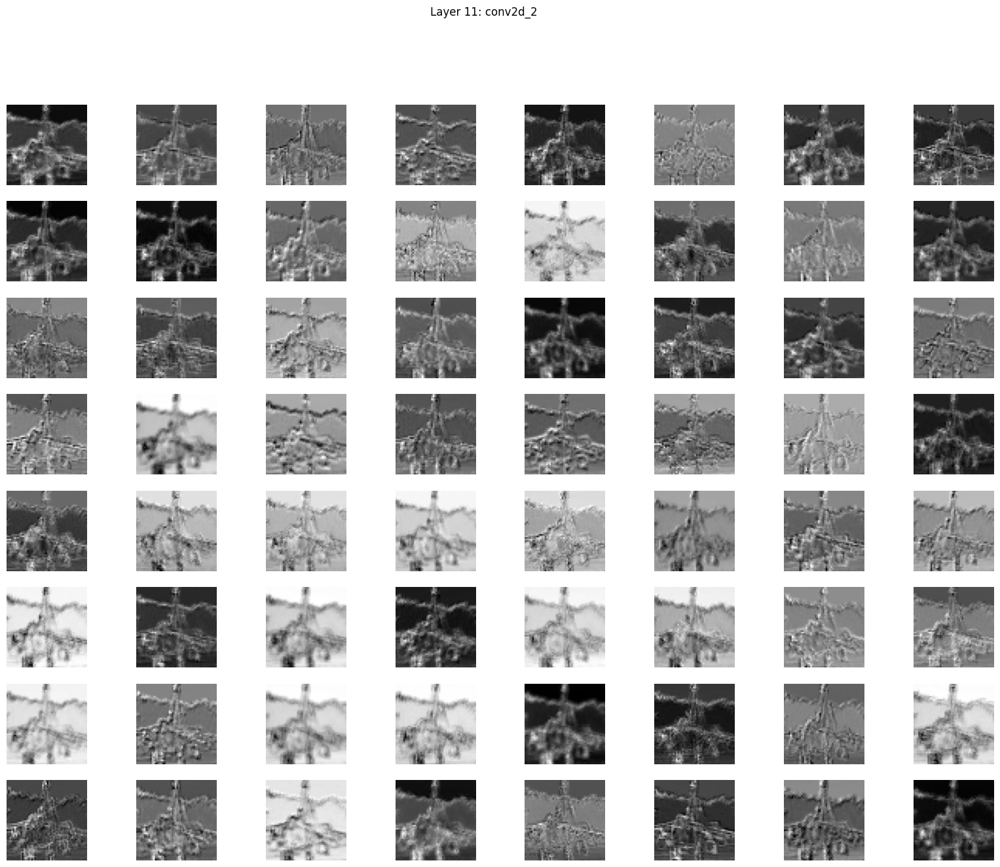

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


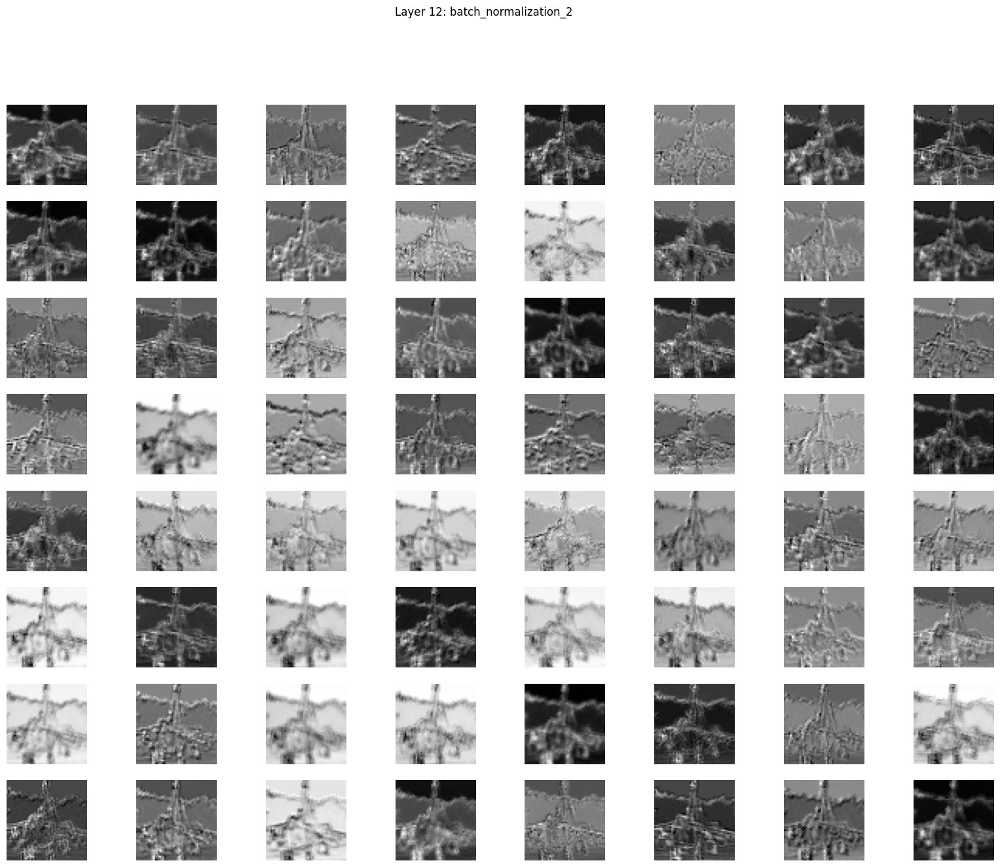

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


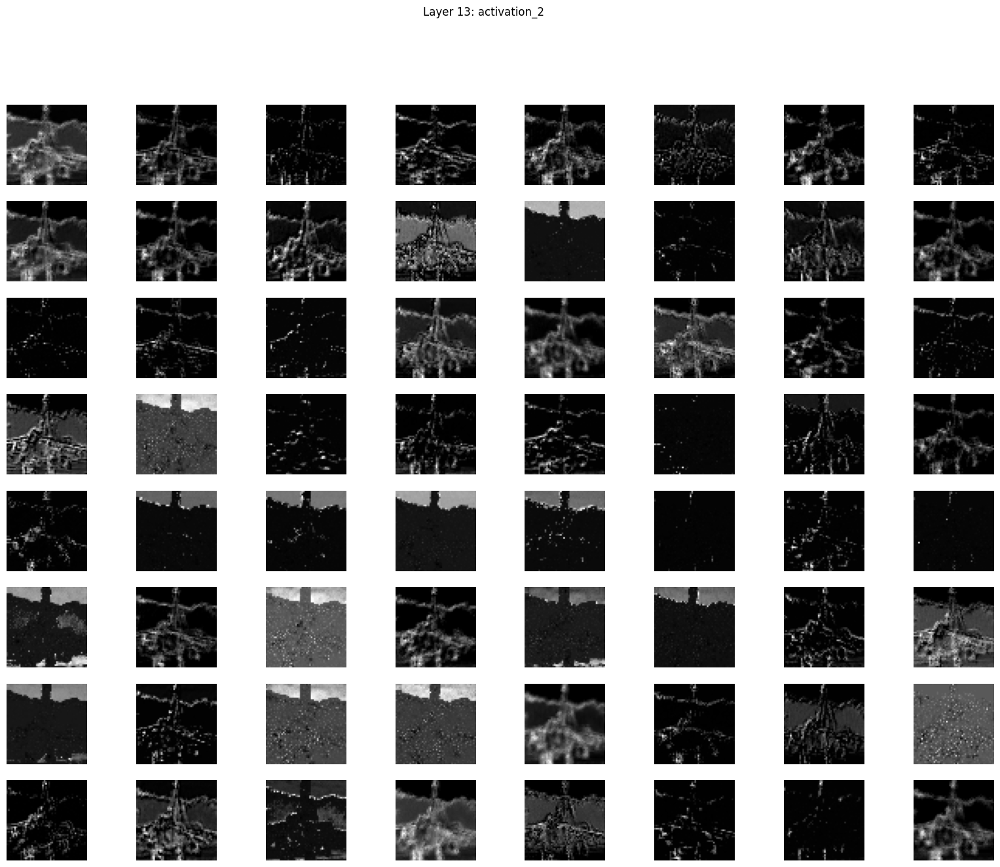

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step


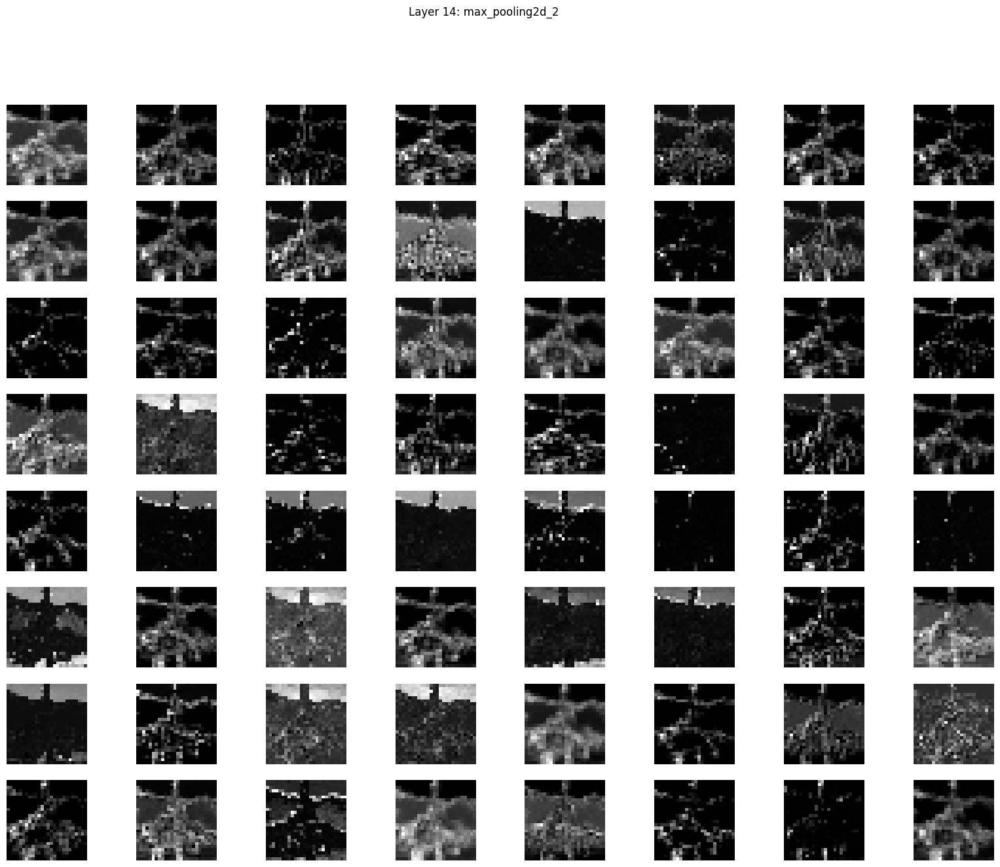

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


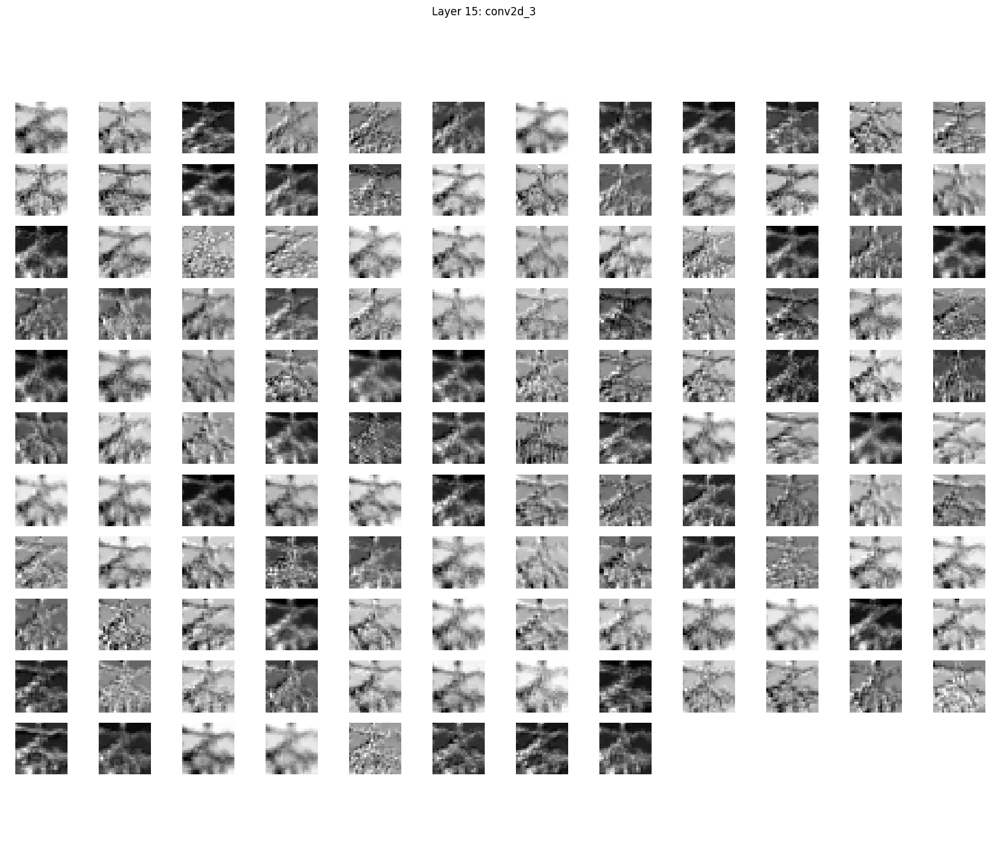

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


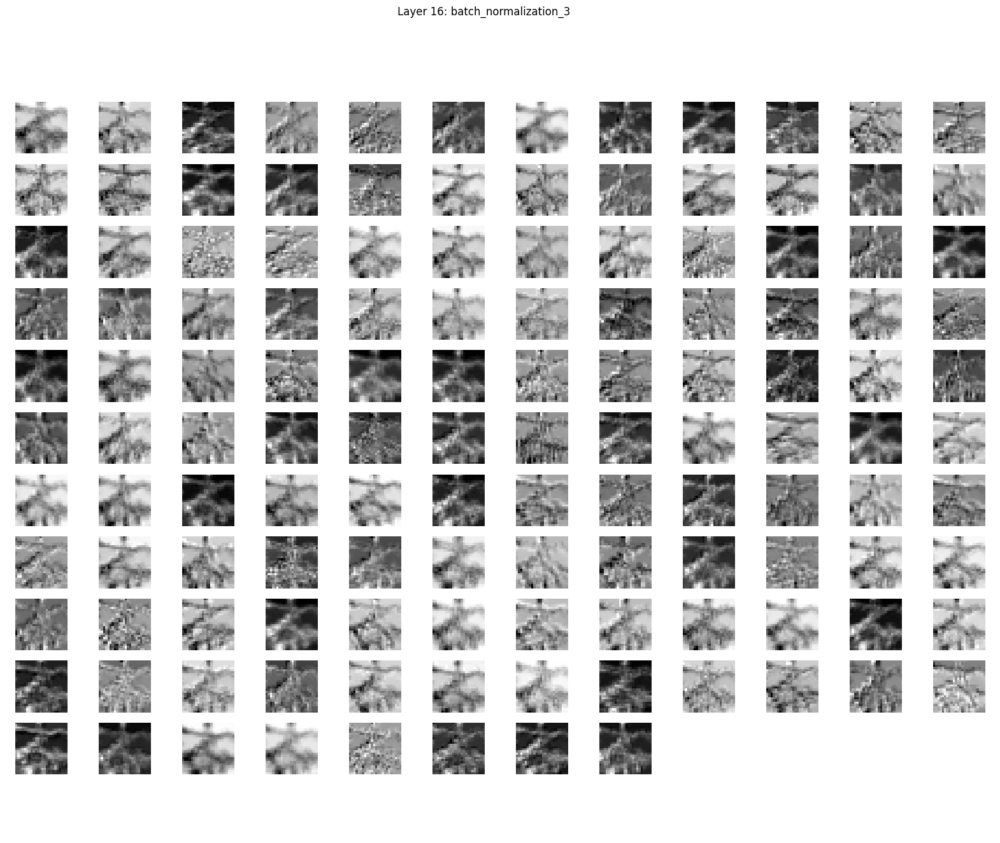

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


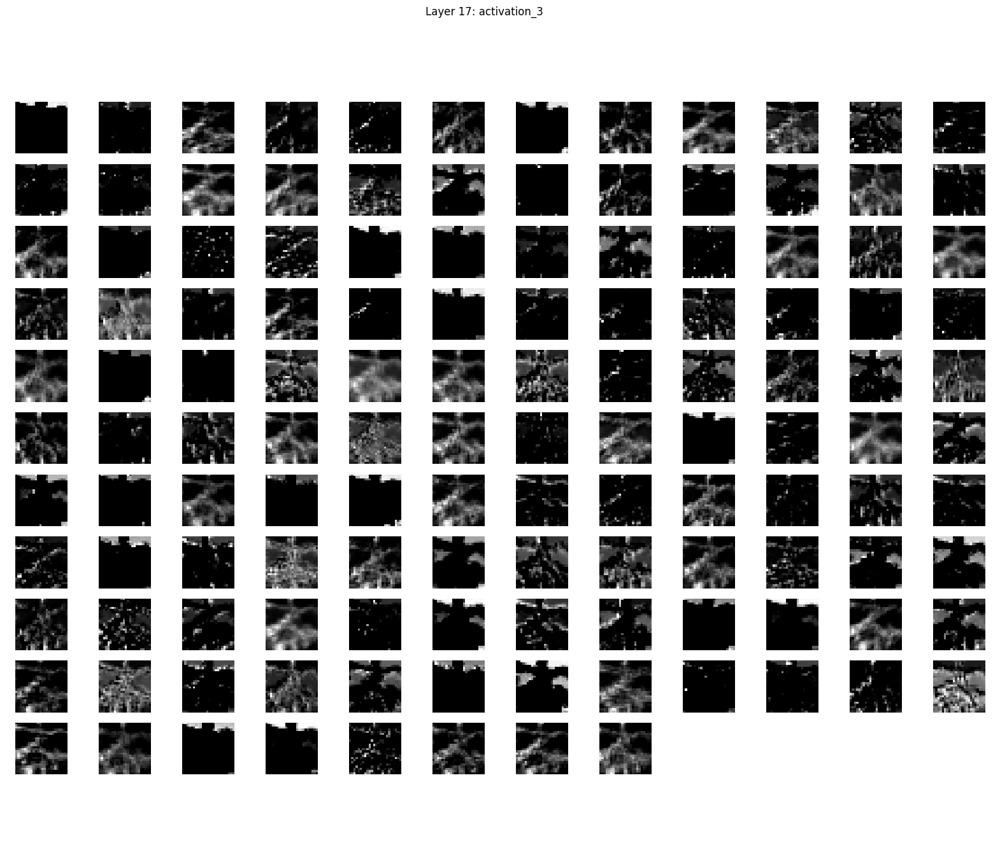

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


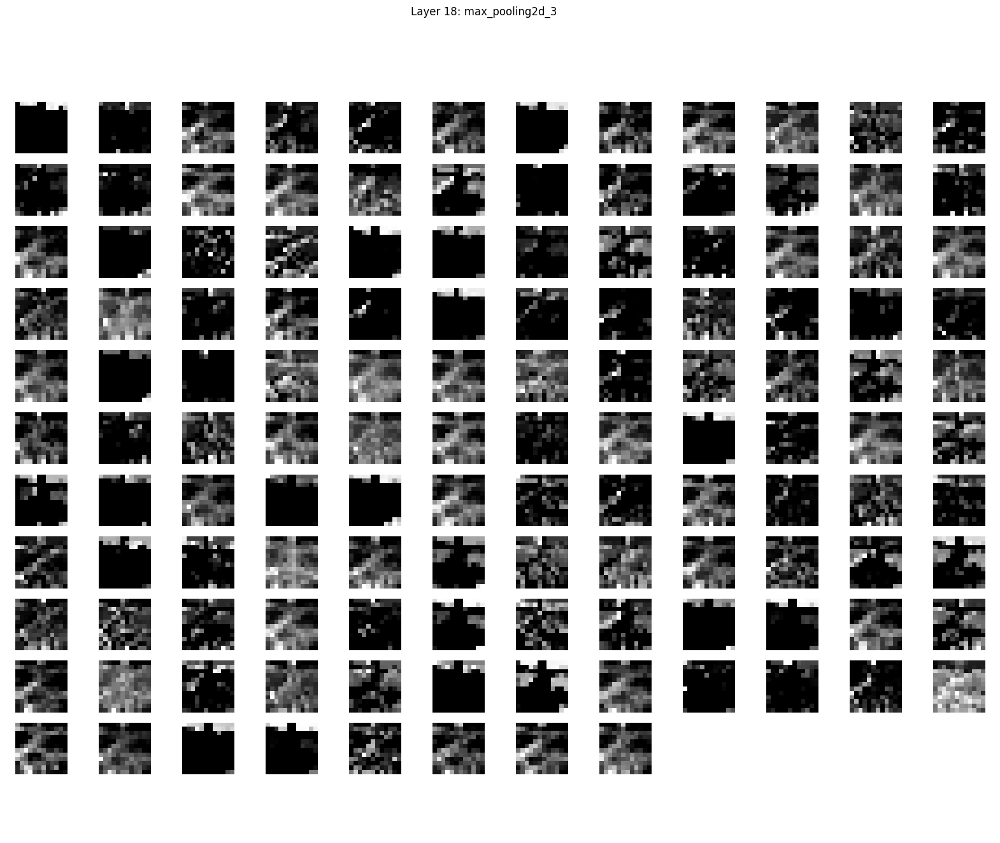

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


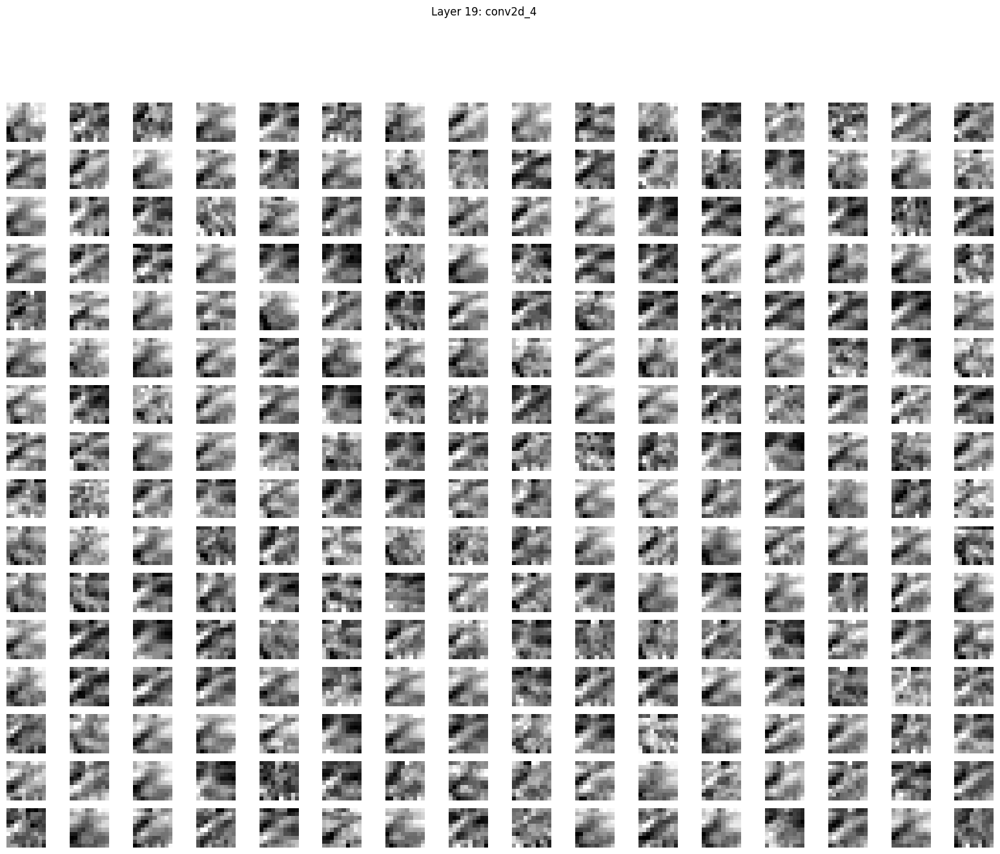

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step


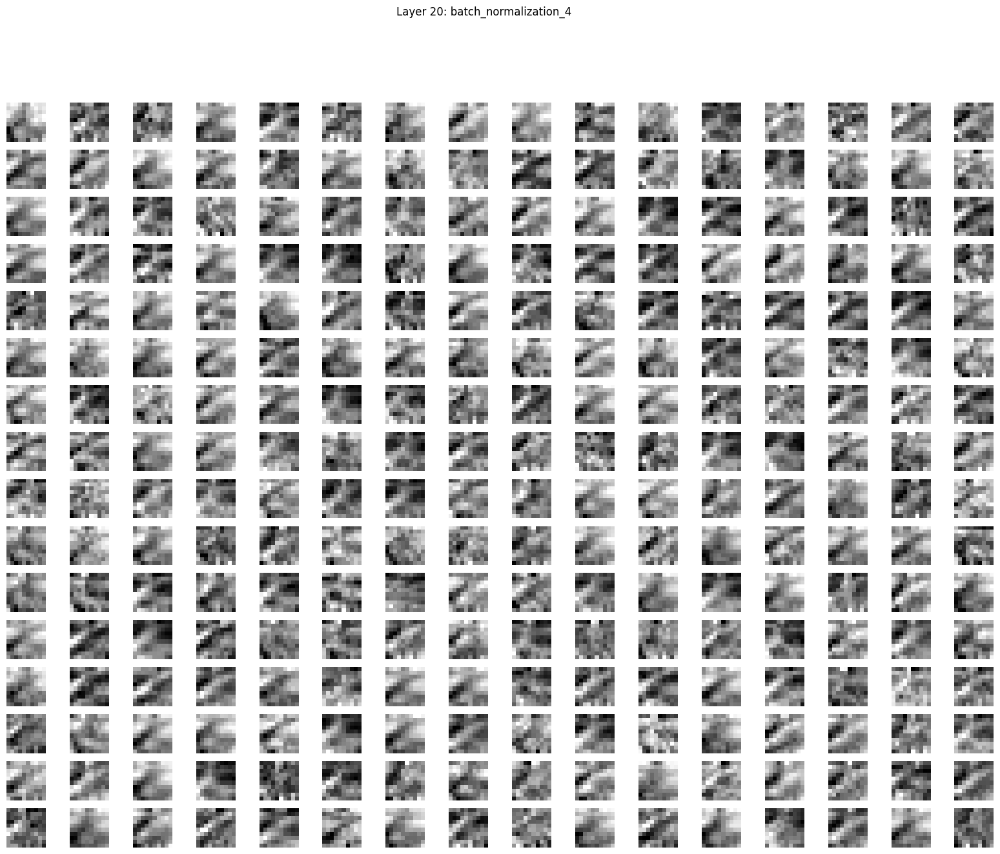

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


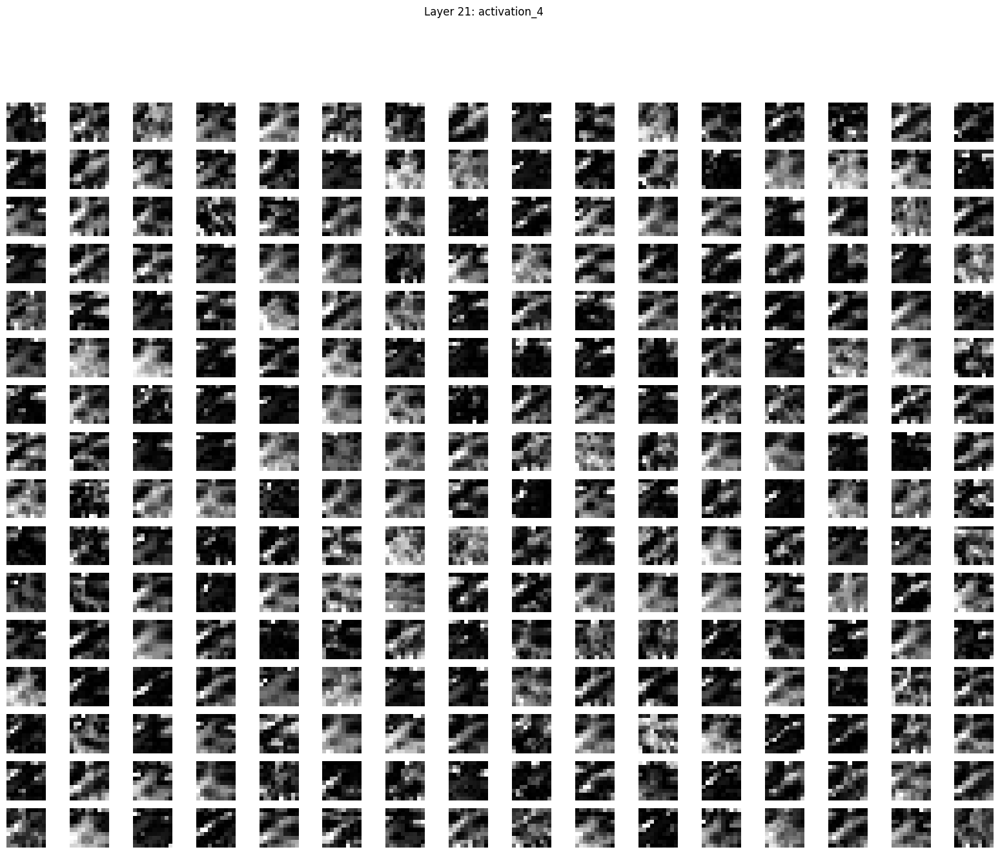

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


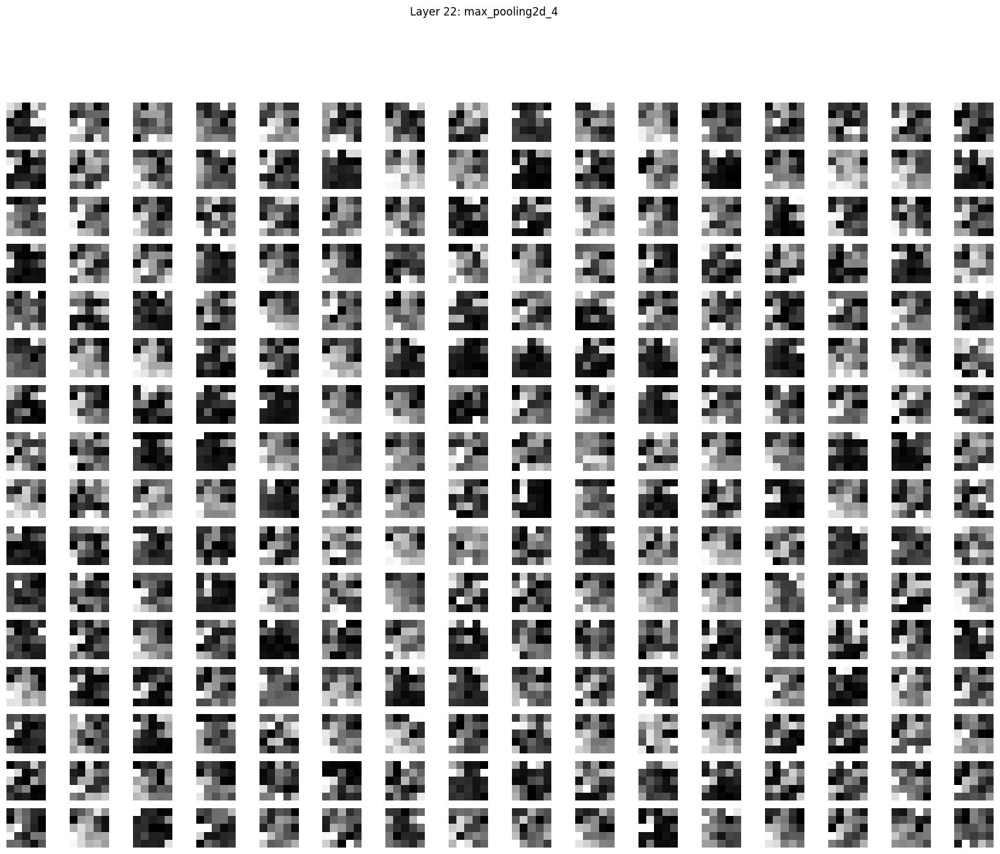

In [ ]:
# import Model
from tensorflow.keras.models import Model
# imports for image preprocessing
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
import numpy as np
from tensorflow.keras.applications.vgg16 import preprocess_input
# import matplotlib
import matplotlib.pyplot as plt

# Load input image
image = load_img("/content/mil1.jpg", target_size=(224, 224))
# Convert the image to an array
image = img_to_array(image)
# Expand dimensions so that it represents a single 'sample'
image = np.expand_dims(image, axis=0)
# Prepare the image for VGG model (i.e., scale pixel values)
image = preprocess_input(image)

# Loop through each layer in the model
for layer_index in range(22):
    # Create a new model that outputs the features of the current layer
    model2 = Model(inputs=model.inputs, outputs=model.layers[layer_index].output)

    # Calculating features_map
    features = model2.predict(image)

    # Determine the number of channels in the feature maps
    num_channels = features.shape[-1]

    # Calculate grid size dynamically based on the number of channels
    grid_size = int(np.ceil(np.sqrt(num_channels)))

    # Visualize feature maps
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 15))
    axes = axes.flatten()

    for i in range(num_channels):
        axes[i].imshow(features[0, :, :, i], cmap='gray')
        axes[i].axis('off')

    # If there are unused subplots, hide them
    for i in range(num_channels, len(axes)):
        axes[i].axis('off')

    plt.suptitle(f"Layer {layer_index + 1}: {model.layers[layer_index].name}")
    plt.show()
